## Chapter 6: First order methods

# 6.4 Gradient descent

In the previous Section we examined some fundamental characteristics of the tangent line / hyperplane defined by a function's first order Taylor series approximation.  In particular we saw how the negative gradient at a point provides a valid descent direction for a function itself, i.e., a direction that (at least locally) decreases the value of the function.  With this fact in hand it is then quite natural to ask the question: can we onstruct a local optimization method using the negative gradient at each step as our descent direction?  The answer is a resounding "yes", and the resulting scheme is precisely the *gradient descent algorithm* we aim to describe with this Chapter in full, and this Section in particular.    

In [2]:
# This code cell will not be shown in the HTML version of this notebook
# import standard tools
import sys
sys.path.append('../../')
import autograd.numpy as np
import time

# import custom plotting tools
from mlrefined_libraries import math_optimization_library as optlib
static_plotter = optlib.static_plotter.Visualizer();
anime_plotter = optlib.animation_plotter.Visualizer();

# the next three lines are needed to compensate for matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

##  6.4.1  The gradient descent algorithm

As we introduced in the previous Chapter, a local optimization method is one where we aim to find minima of a given function by beginning at some point $\mathbf{w}^0$ and taking number of steps $\mathbf{w}^1, \mathbf{w}^2, \mathbf{w}^3,...,\mathbf{w}^{K}$ of the generic form 

\begin{equation}
\mathbf{w}^{\,k} = \mathbf{w}^{\,k-1} + \alpha \mathbf{d}^{\,k}.
\end{equation}

where $\mathbf{d}^{\,k}$ are direction vectors (which ideally are *descent directions* that lead us to lower and lower parts of a function) and $\alpha$ is called the *steplength* parameter.  In Chapter 5 we saw in one simple example of a local method called random local search, which was fatally flawed due to the way it determines each *descent direction* $\mathbf{d}^{\,k}$ -i.e., via random search - which grows exponentially more inefficient as the dimension of a function's input increases.  (see Section 5.3 for a complete introduction to this concept).

In our current setting - where we have just reviewed (in the previous Section) how the negative gradient $-\nabla g\left(\mathbf{w}\right)$ of a function $g\left(\mathbf{w}\right)$ computed at a particular point *always* defines a valid descent direction there - we are perfectly poised to think about another local method employing first order descent directions.  We could very naturally ask what a local method employing the negative gradient direction at each step might look like, and how it might behave - i.e., setting $\mathbf{d}^{k} = -\nabla g\left(\mathbf{w}^{k-1}\right)$ in the above formula.  Such a sequence of steps would then take the form

\begin{equation}
\mathbf{w}^{\,k} = \mathbf{w}^{\,k-1} - \alpha \nabla g\left(\mathbf{w}^{k-1}\right)
\end{equation}

and it seems intuitive - at least at the outset - that because each and every direction is guranteed to be one of descent here that (provided we set $\alpha$ appropriately, as we must do whenever using a local optimization method)taking such steps could lead us to a point near the a local minimum of any function.  

Indeed this is precisely the *gradient descent algorithm*.  It is it called *gradient descent* - in employing the (negative) gradient as our descent direction - we are repeatedly *descending* in the *(negative) gradient direction* at each step.  

> The *gradient descent algorithm* is a local optimization method where - at each step - we employ the negative gradient as our descent direction.

Appreciate the power of this descent direction - which is almost literally given to us - over the zero-order methods detailed in the previous Chapter.  There we had to *search* to find a descent direction, here calculus provides us not only with a descent direction (without search), but an excellent one to boot. 

The path taken by gradient desscent is illustrated figuratively below for a general single-input function.  At each step of this local optimization method we can think about drawing the first order Taylor series approximation to the function, and taking the descent direction of this tangent hyperplane (the negative gradient of the function at this point) as our descent direction for the algorithm.  Beginning at the point $w^0$ the point at which we make our first approximation is drawn below as a red dot, with the first order Taylor series approximation drawn in green.  Moving in the negative gradient descent direction provided by this approximation we arrive at a point $w^1 = w^0 - \alpha \frac{\partial}{\partial w}g\left(w^0\right)$ (remember - for a single input function the gradient is simply a single derivative), having taken our first gradient descent step.  We then repeat this process at $w^1$, moving in the negative gradient direction there, to $w^2 = w^1 - \alpha \frac{\partial}{\partial w}g\left(w^1\right)$, and so forth.

<figure>
<img src="../../mlrefined_images/math_optimization_images/Fig_2_7.png" width=700 height=250/>
  <figcaption>   
<strong>Figure 1:</strong> <em> A figurative drawing of the gradient descent algorithm.  The first order Taylor series approximation - and the *negative gradient* of the function in particular - provides an excellent and easily computed descent direction at each step of this local optimization method (here a number of Taylor series approximations are shown in green, and evaluations by the function and linear approximations are shown as red dots and crosses respectively).  Employing these directions at each step the *gradient descent algorithm* can be used to properly minimize generic functions.  Moreover, unlike the random local search algorithm, gradient descent scales very well with input dimension since the descent direction of a hyperplane is much more easily computed in high dimensions.
</em>  </figcaption> 
</figure>

As we will see here and throughout many of our future Chapters, the gradient descent algorithm is a far better local optimization algorithm than the zero order approaches discussed in the previous Chapter (indeed it is probably the most popular optimization algorithm used in machine learning / deep learning today).  This is entirely due to the fact that the descent direction here - provided by calculus via the gradient - is universally easier to compute (particularly as the dimension of the input increases) than e.g., seeking out a descent direction at random.  To this point (as discussed in Chapter 3) we can very easily compute the gradient of almost any generic function of interest using a gradient calculator known as an Automatic Differentiator.  So in practice we need not even have to worry about computing the form of a function's gradient 'by hand'.

Below we provide the generic pseudo-code and ``Python`` implementation of the gradient descent algorithm which will be used in a variety of examples that follow in this Section.  We describe the most basic yet perhaps the most common implementation, but there are a number of practical variations one can use in practice - like e.g., different halting conditions other than a maximum number of steps, or what values are returned by the method - which we touch on below as well.

### The gradient descent algorithm

<hr style="height:1px;border:none;color:#555;background-color:#555;"/>
<p style="line-height: 1.7;">
<strong>1:</strong>&nbsp;&nbsp; <strong>input:</strong> function $g$, steplength $\alpha$, maximum number of steps $K$, and initial point $\mathbf{w}^0$ <br/>

<strong>2:</strong>&nbsp;&nbsp; <code>for</code> $\,\,k = 1...K$<br/>

<strong>3:</strong>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;         $\mathbf{w}^k = \mathbf{w}^{k-1} - \alpha \nabla g\left(\mathbf{w}^{k-1}\right)$ <br/>

<strong>4:</strong>&nbsp; <strong>output:</strong> history of weights $\left\{\mathbf{w}^{k}\right\}_{k=0}^K$ and corresponding function evaluations $\left\{g\left(\mathbf{w}^{k}\right)\right\}_{k=0}^K$ <br/>

<hr style="height:1px;border:none;color:#555;background-color:#555;"/>
</p>

Note in particular the return values we have chosen to output in our pseudo-code above: 
both the entire sequence of gradient descent steps $\left\{\mathbf{w}^{k}\right\}_{k=0}^K$ and corresponding cost function evaluation $\left\{g\left(\mathbf{w}^{k}\right)\right\}_{k=0}^K$  computed while running the algorithm are returned.  As we explore via examples below, the entire weight history is typically returned so that we - as good engineers - can visualize the progress of our algorithm for a given choice of the steplength parameter $\alpha$.  The corresponding sequence of cost function evaluations is also returned for the same reason.  It is especially important to recognize that when employing an Automatic Differentiator to compute each gradient evaluation - as we do here (we use [autograd](https://github.com/HIPS/autograd) throughout this and future Chapters, but one can construct their own tool following the discussion in Chapter 3) - that we get each of these evaluations 'for free' when computing the corresponding gradient evaluation (this is the very nature of Automatic Differentiation computation - as described in Chapter 3).  So - in terms of evaluating the function itself - we only need to do this ourselves at the final step (since we do not compute the gradient there).

In the next ``Python`` cell we implement gradient descent as described above.  It involves just a few requisite initializations, the computation of the gradient function via e.g., an Automatic Differentiator, and the very simple ``for`` loop.  The output is a history of the weights and corresponding cost function values at each step of the gradient descent algorithm.

In [3]:
# using an automatic differentiator - like the one imported via the statement below - makes coding up gradient descent a breeze
from autograd import value_and_grad 

# gradient descent function - inputs: g (input function), alpha (steplength parameter), max_its (maximum number of iterations), w (initialization)
def gradient_descent(g,alpha_choice,max_its,w):
    # compute the gradient function of our input function - note this is a function too
    # that - when evaluated - returns both the gradient and function evaluations (remember
    # as discussed in Chapter 3 we always ge the function evaluation 'for free' when we use
    # an Automatic Differntiator to evaluate the gradient)
    gradient = value_and_grad(g)

    # run the gradient descent loop
    weight_history = []      # container for weight history
    cost_history = []        # container for corresponding cost function history
    alpha = 0
    for k in range(1,max_its+1):
        # check if diminishing steplength rule used
        if alpha_choice == 'diminishing':
            alpha = 1/float(k)
        else:
            alpha = alpha_choice
        
        # evaluate the gradient, store current weights and cost function value
        cost_eval,grad_eval = gradient(w)
        weight_history.append(w)
        cost_history.append(cost_eval)

        # take gradient descent step
        w = w - alpha*grad_eval
            
    # collect final weights
    weight_history.append(w)
    # compute final cost function value via g itself (since we aren't computing 
    # the gradient at the final step we don't get the final cost function value 
    # via the Automatic Differentiatoor) 
    cost_history.append(g(w))  
    return weight_history,cost_history

Notice - like any local method - in terms of steplength parameter choices we have included in this implementation the ability to choose both fixed and the particular diminishing steplength choice $\alpha = \frac{1}{k}$.

## 6.4.2 General behavior of gradient descent

In this Subsection we walk through a number of simple examples using the gradient descent code above, many of which exhibit more general behaviors of the algorithm.  This includes

- **Gradient descent converges to stationary points of a function:** because we employ the (negative) gradient as our descent direction, the algorithm converges at / nearby stationary points 


- **Gradient descent makes great progress far from stationary points, but crawls to a halt near them**: in addition to the steplength parameter $\alpha$ the magnitude of the gradient controls how far we travel at each step of gradient descent, and this has both positive and negative consequences for performance


- **Non-convexity is not an inherent problem for gradient descent, but saddle points are:** due to its convergence behavior saddle points pose an inherent problem for gradient descent


- **Gradient descent scales well with input dimension:** because the gradient can be computed extremely efficiently gradient descent scales very well, computationally speaking, with the size of input dimension


- **Just like all local methods, one needs to carefully choose the steplength parameter $\alpha$:** like all local optimization methods the steplength parameter $\alpha$ must be set properly in order to provoke timely convergence, with the most popular choices in machine learning / deep learning being the fixed and diminishing steplength rules introduced Section 5.3 

Lets dig deeper into the details and basic behavior of the gradient descent algorithm by looking at a few simple examples.

 #### <span style="color:#a50e3e;">Example 1. </span>  Gradient descent converges to stationary points of a function

Here we use gradient descent to minimize the polynomial function

\begin{equation}
g(w) = \frac{1}{50}\left(w^4 + w^2 + 10w\right).
\end{equation}

In Section 6.1 on the *first order optimality condition*  we saw that the global minimum of this problem - which we could not compute by hand easily - was given explicitly as  

\begin{equation}
w = \frac{\sqrt[\leftroot{-2}\uproot{2}3]{\sqrt[\leftroot{-2}\uproot{2}]{2031} - 45}}{6^{\frac{2}{3}}} - \frac{1}{\sqrt[\leftroot{-2}\uproot{2}3]{6\left(\sqrt{2031}-45\right)}}
\end{equation}

With gradient descent we can easily determine a point that is arbitrarily close to this one.  This illustrates the general principle that gradient descent - and local search in general - can compute minima of functions that we cannot compute by hand using calculus alone.

In the next ``Python`` cell we animate the process of gradient descent applied to minimize this function.  We initialize the algorithm at $w^0 = 2.5$, set the steplength constant for all steps as $\alpha = 1$, and run for 25 iterations.  As you move the slider left to right the descent process as described above is shown visually - including the illustration of the tangent line.  We mark the evaluation of each step of the process on both the function and the tangent line for visualization purposes.  Moving the slider all the way to the right we can see that the algorithm begins to slow down considerably near the global minimum of the function.

In [3]:
# what function should we play with?  Defined in the next line.
g = lambda w: 1/float(50)*(w**4 + w**2 + 10*w)   # try other functions too!  Like g = lambda w: np.cos(2*w) , g = lambda w: np.sin(5*w) + 0.1*w**2, g = lambda w: np.cos(5*w)*np.sin(w)

# run gradient descent 
w = 2.5; alpha_choice = 1; max_its = 25;
weight_history,cost_history = gradient_descent(g,alpha_choice,max_its,w)


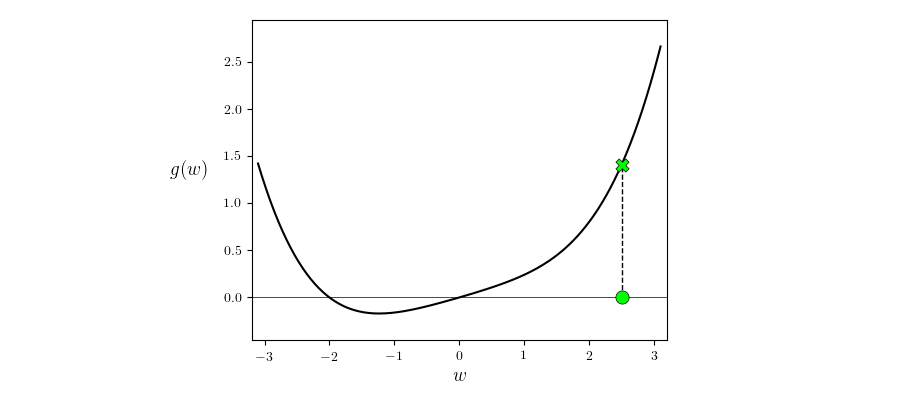
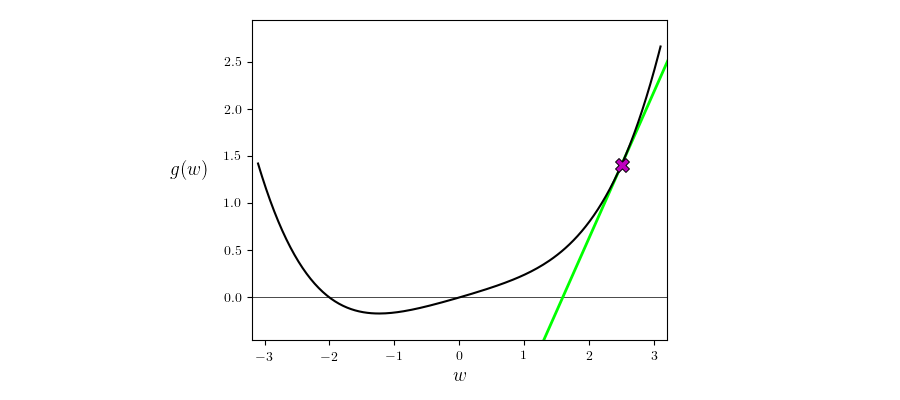
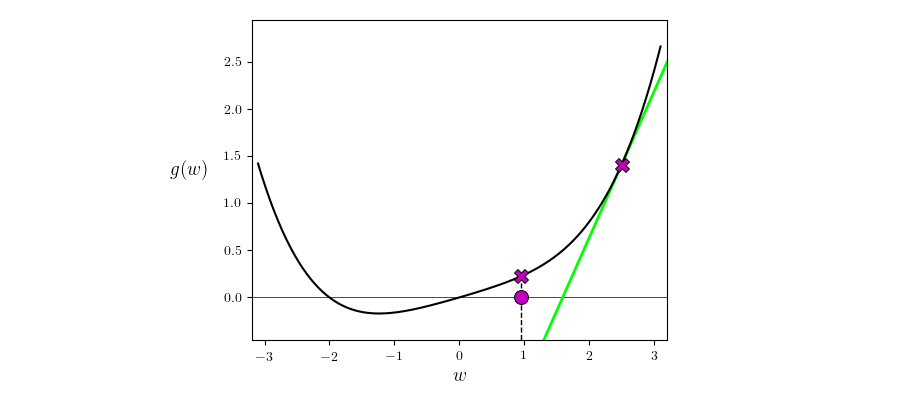
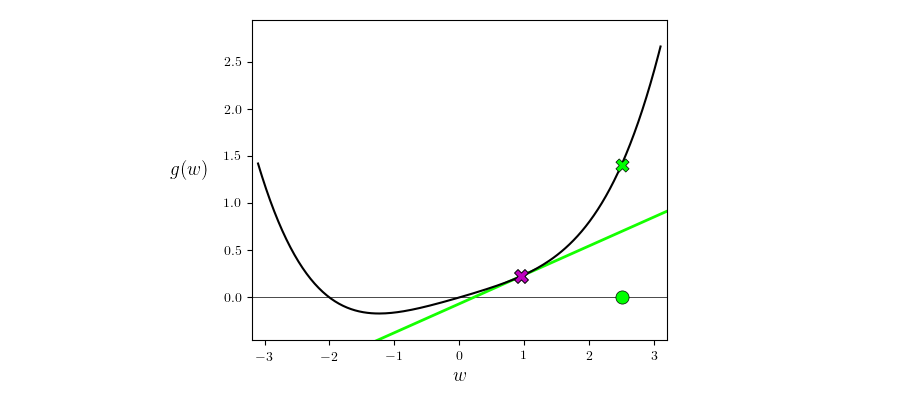
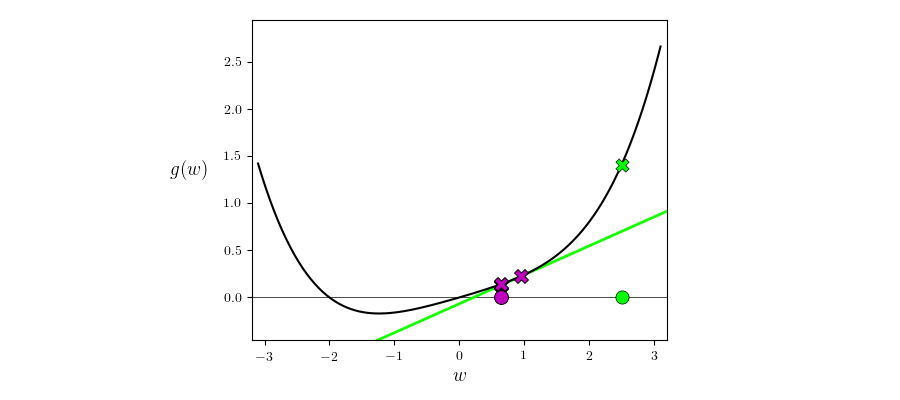
...
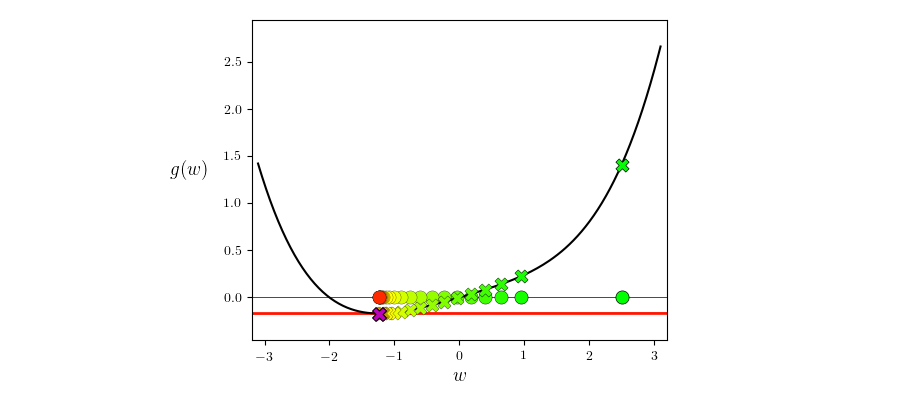
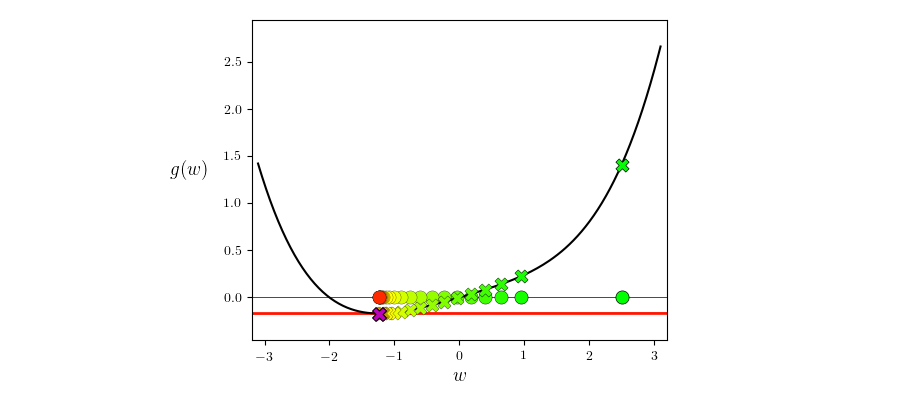
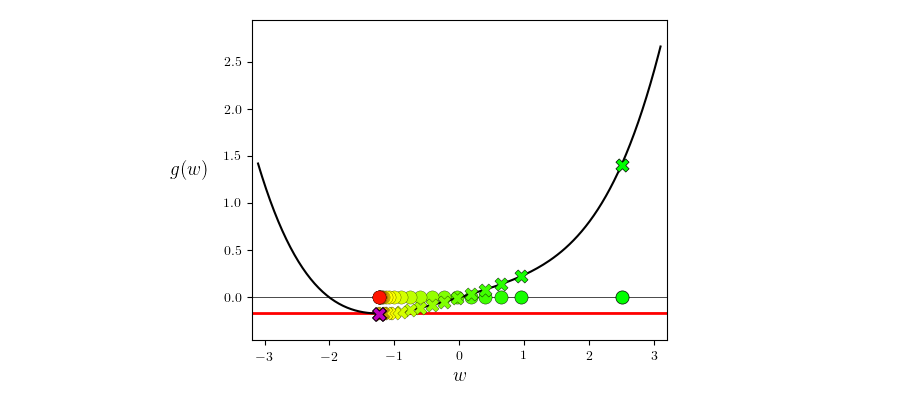
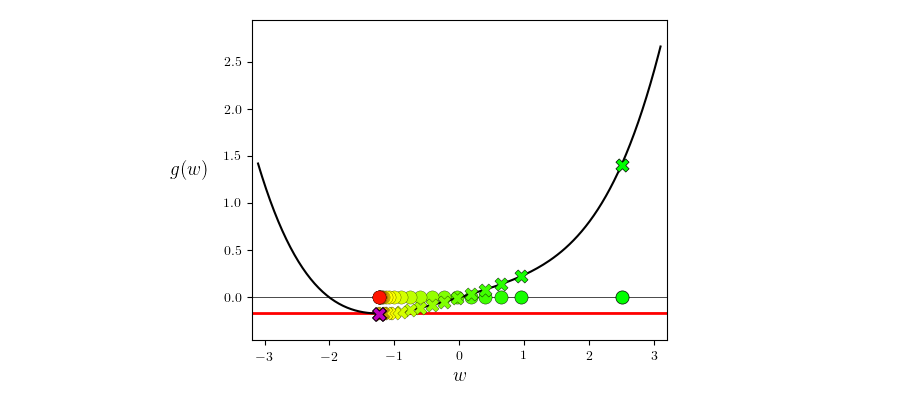
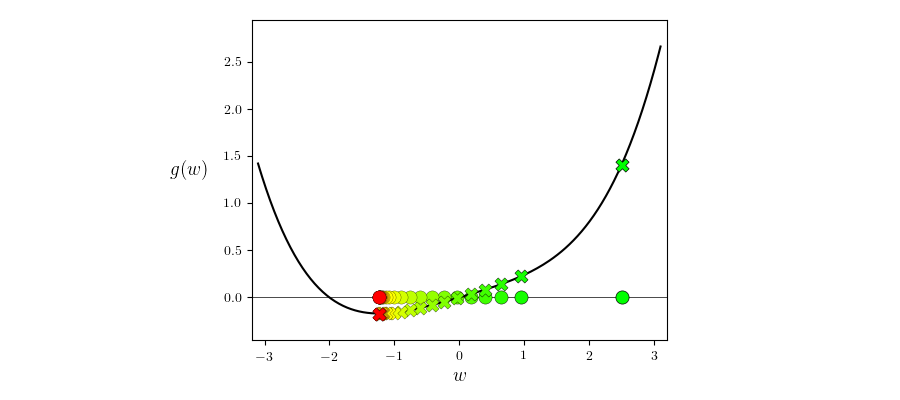

In [4]:
# animate gradient descent applied to minimizing this function
anime_plotter.gradient_descent(g,weight_history)

Notice in playing with the slider above how the slope of the tangent line - which is the magnitude of the derivative - goes to zero as we approach the minimum because here $\nabla g\left(\mathbf{w}^k\right) \approx \mathbf{0}_{N\times 1}$.  This sort of behavior happens more generally as well whenever gradient descent approaches any *stationary point* of a function.  This makes sense for a variety of reasons. 

First off if gradient descent does truly reach a minimum point on a function we know - from the *first order condition* discussed in Section 6.1 - that the gradient here must indeed be vanishing.  Secondly we can see from the very form of the gradient descent step

\begin{equation}
\mathbf{w}^{\,k} = \mathbf{w}^{\,k-1} - \alpha \nabla g\left(\mathbf{w}^{k-1}\right)
\end{equation}

that the only way for this algorithm to truly converge - that is for the steps to settle down and stop changing i.e., $\mathbf{w}^{k-1} \approx \mathbf{w}^k$ - is for the gradient to be approximately zero $\nabla g\left(\mathbf{w}^k\right) \approx \mathbf{0}_{N\times 1}$.  In other words, gradient descent halts only near points satisfying the first order condition for optimality.

Next we run gradient descent on the multi-input quadratic function $g(w_1,w_2) = w_1^2 + w_2^2 + 2$.  We take 10 steps each using the steplength $\alpha = 0.1$.  Notice how this only helps define the length between steps, which is also dependent on the magnitude of the gradient at each step (we speak more regarding this point below).  We illustrate the path taken by this run of gradient descent in the input space of the function, coloring the steps from red (near the start of the run) to green as the method finishes.  This is shown along with the three-dimensional surface of the function in the left panel, and 'from above' showing the contours of the function on its input space in the right panel.  Once again we halt near a stationary point, here the global minimum of the function. 

In [4]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.dot(w.T,w) + 2

# run gradient descent 
w = np.array([1.5,2]); max_its = 10; alpha_choice = 0.2;
weight_history,cost_history = gradient_descent(g,alpha_choice,max_its,w)

<IPython.core.display.Javascript object>


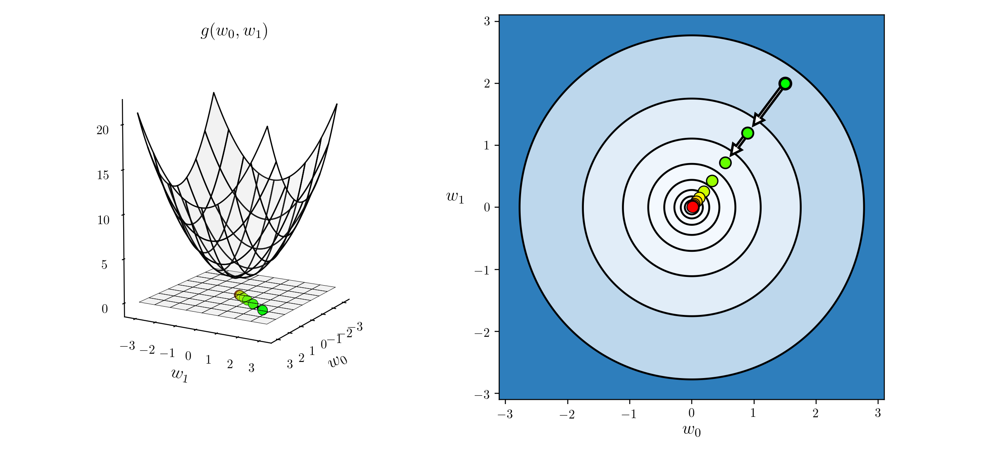

In [7]:
# show run in both three-dimensions and just the input space via the contour plot
static_plotter.two_input_surface_contour_plot(g,weight_history,view = [10,30])

We can visualize this - as well as any other run of a local optimization method - by using the *cost function history plot* (see Section 5.4 where this visualization was first introduced).  In short, this allows us to view the progress of this run (for parameter tuning and debugging purposes) regardless of the dimension of the function we are minimizing.

<IPython.core.display.Javascript object>


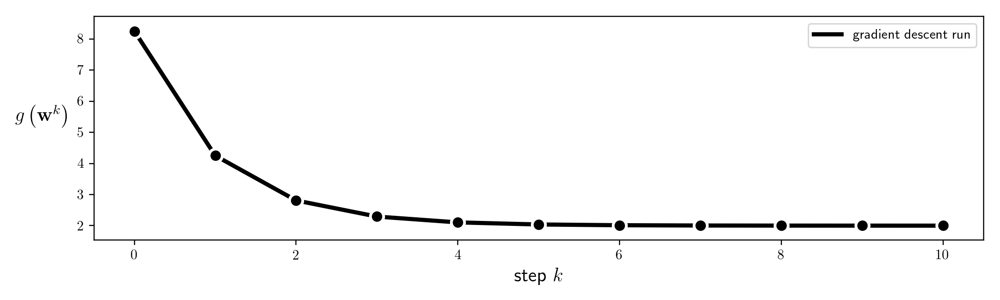

In [7]:
# plot the cost function history for a given run
static_plotter.plot_cost_histories([cost_history],start = 0,points = True,labels = ['gradient descent run'])

#### <span style="color:#a50e3e;">Example 2. </span> Gradient descent makes great progress far from stationary points, but crawls to a halt near them

Notice in both of instances shown in the example above that while the steplength parameter $\alpha$ has been fixed for all iterations, the actual length of each step appears to be changing from step-to-step.  In the previous Chapter, where zero-order approaches were introduced, we only saw this sort of behavior when using a *diminishing* steplength (otherwise the distance traveled from step-to-step remained constant and equal to the ateplength parameter $\alpha$).

There are two reasons for this behavior.  First notice that if we analyze the length of the $k^{th}$ step - i.e., the value $\Vert \mathbf{w}^k - \mathbf{w}^{k-1} \Vert_2$ - we can see that


\begin{equation}
\Vert \mathbf{w}^k - \mathbf{w}^{k-1} \Vert_2 = \Vert \left(\mathbf{w}^{k-1} - \alpha\nabla g\left(\mathbf{w}^{k-1}\right) \right) - \mathbf{w}^{k-1} \Vert_2  = \alpha \Vert \nabla g\left(\mathbf{w}^{k-1}\right) \Vert_2.
\end{equation}

In other words, the length of the $k^{th}$ step is equal to the value of $\alpha$ *times* the magnitude of the descent direction = the gradient at the previous step.  This differs from the simple zero-order search methods described in the previous Chapter where - by choice - we used descent directions of unit length, and hence the length of each step was completely controlled by the steplength parameter $\alpha$.  

Since the length of each step is proportional to the magnitude of the gradient this means that when that magnitude is large - e.g., at points far away from a stationary point where the gradient / slope(s) of the tangent hyperplane are large - gradient descent takes larger steps.  Conversely, when close to a stationary point where the gradient / slopes of the tangent hyperplane are small (and near zero), gradient descent takes small steps.

Below we show another example run of gradient descent using a function 

\begin{equation}
g(w) = w^4 + 0.1
\end{equation}

whose mininum is at the origin $w = 0$.  This example further illustrates the effect of gradient magnitude on the length of each gradient descent step.  In particular showing how steps can be quite large far from a stationary point, but then get very small as we get closer and closer to the minimum of this function.  Note here that we have initialized and set the steplength parameter $\alpha = 0.1$ for $15$ steps to exaggerate this behavior, so that it is more clearly visible (the original function is shown in the left panel, and with steps in the right panel colored from green = start to red = final step).

<IPython.core.display.Javascript object>


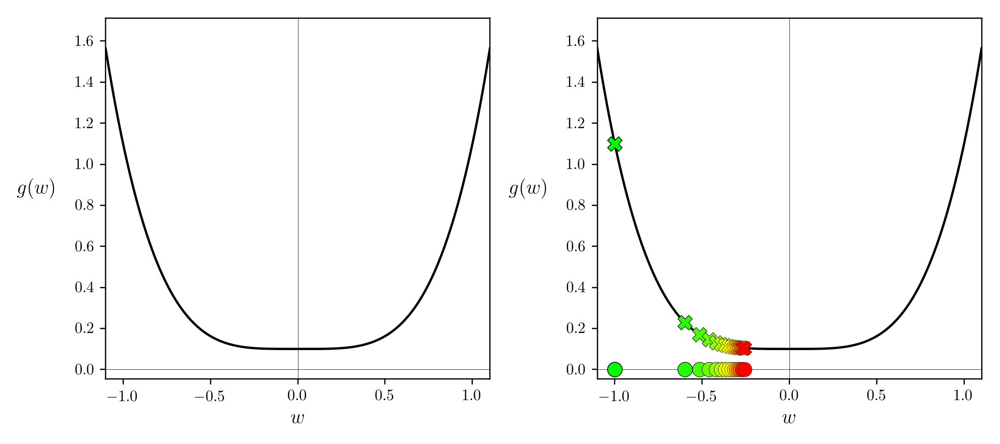

In [8]:
# what function should we play with?  Defined in the next line.
g = lambda w: w**4 + 0.1

# run gradient descent 
w = -1.0; max_its = 15; alpha_choice = 0.1;
weight_history,cost_history = gradient_descent(g,alpha_choice,max_its,w)

# make static plot showcasing each step of this run
static_plotter.single_input_plot(g,[weight_history],[cost_history],wmin = -1.1,wmax = 1.1)

The second reason for gradient descent slowing down near stationary points has to do with the geometric nature of many functions and the descent direction provided by the (negative) gradient.  Akin to the function used above, many functions of interest in machine learning / deep learning have minima that lie in *long narrow valleys* i.e., long flat regions.  Besides the problem described above with such regions of a function, in particular in higher dimensions such functions' long narrow valleys can cause additional trouble for gradient descent due the direction (not the magnitude) of the negative gradient direction.  As we described in Section 6.3.3, the (negative) gradient *always perpendicular to the contour of the function it lies on*.  Because of this  the gradient direction tends to zig-zag in long narrow valleys, causing zig-zagging behavior in gradient descent itself.

We illustrate this behavior with an $N = 2$ dimensional quadratic below.  This function is defined as 

\begin{equation}
g(\mathbf{w}) = a + \mathbf{b}^T\mathbf{w} + \mathbf{w}^T\mathbf{C}\mathbf{w}
\end{equation}

where $a = 0$, $\mathbf{b} = \begin{bmatrix} 1 \\ 1 \end{bmatrix}$, and $\mathbf{C} = \begin{bmatrix} 1\,\,0 \\ 0 \,\, 12\end{bmatrix}$

In [8]:
# define constants for a N=2 input quadratic
a = 0
b = 0*np.ones((2,1))
C = np.array([[1,0],[0,12]])

# a quadratic function defined using the constants above
g = lambda w: (a + np.dot(b.T,w) + np.dot(np.dot(w.T,C),w))[0]

Below we make a run of 15 gradient descent steps beginning at the point $\mathbf{w} = \begin{bmatrix} 8 \\ 0.5 \end{bmatrix}$ to illustrate the zig-zagging behavior of gradient descent when converging in long narrow valleys of multi-input functions.  Note: while this example has been engineered specifically to illustrate this zig-zagging problem, it is something we will encounter in practice with machine learning / deep learning functions.

In [9]:
# run gradient descent 
w = np.array([8,0.5]); max_its = 15; alpha_choice = 8*10**(-2);
weight_history,cost_history = gradient_descent(g,alpha_choice,max_its,w)

<IPython.core.display.Javascript object>


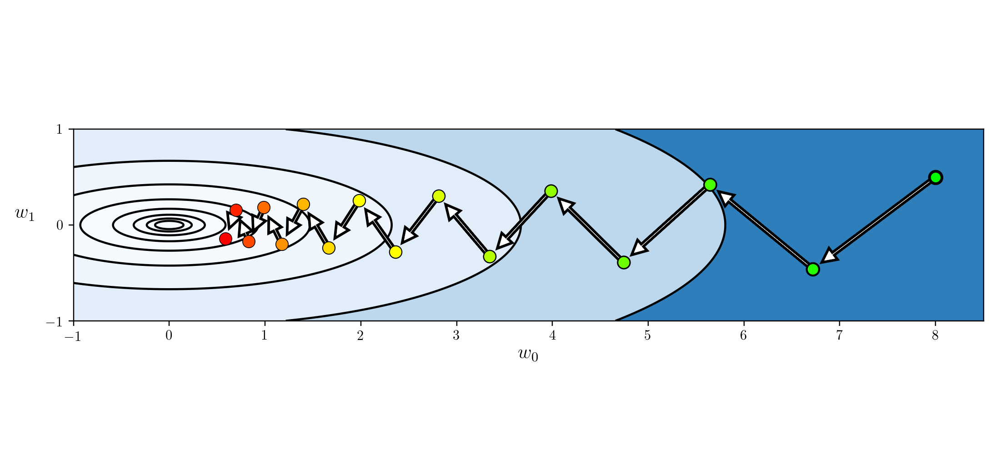

In [12]:
# show run in both three-dimensions and just the input space via the contour plot
static_plotter.two_input_contour_plot(g,weight_history,num_contours = 9,xmin = -1,xmax = 8.5,ymin = -1,ymax = 1,show_original = False)

As another example we look at a single run of $2000$ gradient descent steps to minimize the famous optimization test function called the *Rosenbrock function* which takes the form

\begin{equation}
g\left(w_0,w_1\right) = 100\left(w_0 - w_1^2\right)^2 + \left(w_0 - 1\right)^2.
\end{equation}

This function (whose contour plot is shown in the left panel below) has a global minimum at the point $\mathbf{w}^{\star} = \begin{bmatrix} 1 \\ 1 \end{bmatrix}$ located in a very narrow and curved valley.

As we can see in the right panel below, where the steps of gradient descent are shown in the typical manner, gradient descent struggles to make progress in the long narrow valley containing this function's minimum.  This is due to both of the problems described above.

<IPython.core.display.Javascript object>


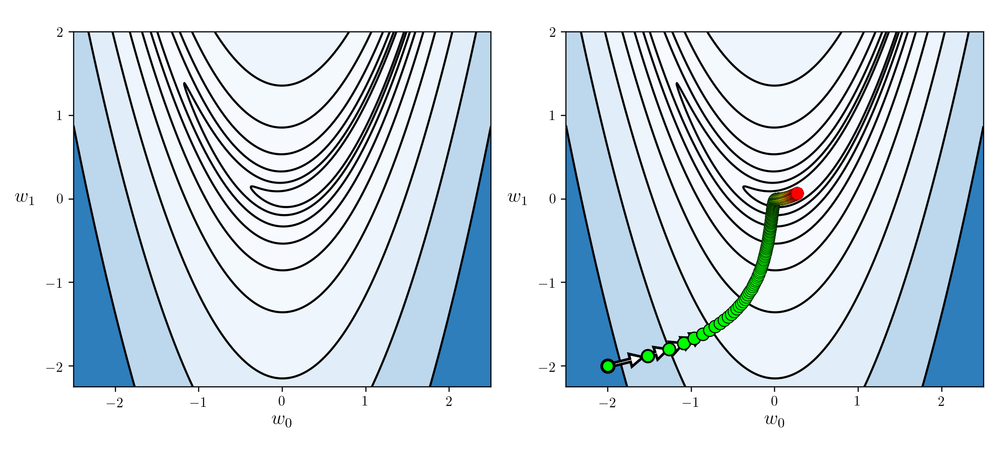

In [12]:
# define function
g = lambda w: 100*(w[1] - w[0]**2)**2 + (w[0] - 1)**2 

# run random search algorithm 
alpha_choice = 0.0001; w = np.array([-2.0,-2.0]); max_its = 2000;
weight_history_1,cost_history_1 = gradient_descent(g,alpha_choice,max_its,w)

# show run in both three-dimensions and just the input space via the contour plot
static_plotter.two_input_contour_plot(g,weight_history_1,num_contours = 9,xmin = -2.5,xmax = 2.5,ymin = -2.25,ymax = 2)

#### <span style="color:#a50e3e;">Example 3. </span> Non-convexity is not an inherent problem for gradient descent, but saddle points are

In order to find the global minimum of a function using gradient descent one may need to run it several times with different initializations and/or steplength schemes - as is true when applying any local optimization method.  Using the function

\begin{equation}
g(w) = \text{sin}(3w) + 0.1w^2
\end{equation}

which is illustrated alone in the left panel below, we initialize two runs - at $w^0 = 4.5$ and $w^0 = -1.5$.  For both runs we use a steplength of $\alpha = 0.05$ fixed for all 10 iterations.  As can be seen by the result (right panel) depending on where we initialize we may end up near a local or global minimum - here resulting from the first and second initialization respectively.  Here we illustrate the steps of each run as circles along the input axis with corresponding evaluations on the function itself as a similarly colored 'x'.  The steps of each run are colored green near the start of the run to red when a run halts.  Notice how - since we are using the normalized version of gradient descent - each step has precisely the length given by the steplength parameter $\alpha$.

<IPython.core.display.Javascript object>


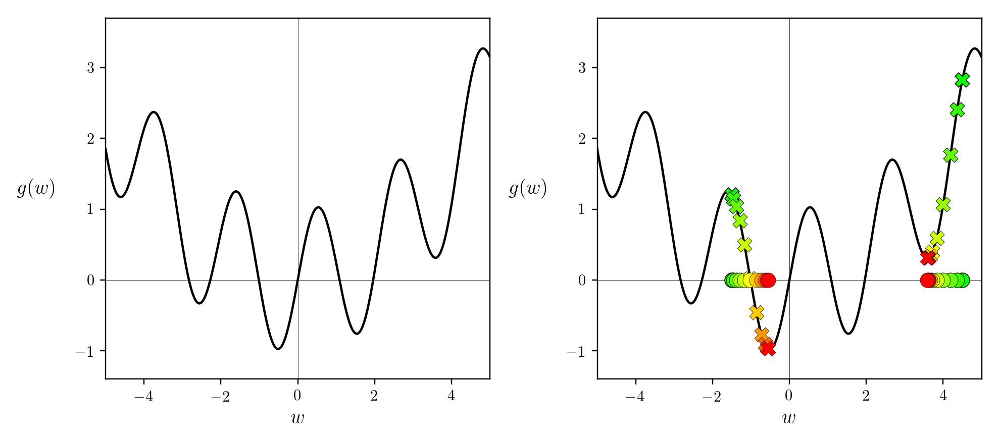

In [13]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.sin(3*w) + 0.1*w**2

# run gradient descent
alpha_choice = 0.05; w = 4.5; max_its = 10;
weight_history_1,cost_history_1 = gradient_descent(g,alpha_choice,max_its,w)

alpha_choice = 0.05; w = -1.5; max_its = 10;
weight_history_2,cost_history_2 = gradient_descent(g,alpha_choice,max_its,w)

# make static plot showcasing each step of this run
static_plotter.single_input_plot(g,[weight_history_1,weight_history_2],[cost_history_1,cost_history_2],wmin = -5,wmax = 5)

We can plot both runs using the *cost function history plot* which allows us to view the progress of gradient descent (or any local optimization method - see Section 5.4 where they are first introduced) runs regardless of the input dimension of the function we are minimizing. 

<IPython.core.display.Javascript object>


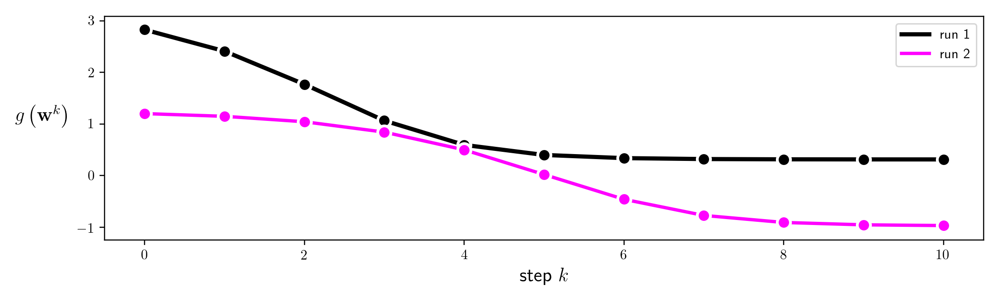

In [14]:
# plot the cost function history for a given run
static_plotter.plot_cost_histories([cost_history_1,cost_history_2],start = 0,points = True,labels = ['run 1','run 2'])

While non-convexity is itself not a problem, *saddle points* of a non-convex function do pose a problem to the progress of gradient descent (as they do for other local optimization methods as well).  This is entirely due to an issue diagnosed in the previous example - that is that gradient descent naturally slows down near any stationary point of a function.  So - in particular - if that stationary point is a saddle point, gradient descent will tend to slow down near it and perhaps converge.

We illustrate this issue below using the non-convex function

\begin{equation}
g(w) = \text{maximum}(0,(3w - 2.3)^3 + 1)^2 + \text{maximum}(0,(-3w + 0.7)^3 + 1)^2
\end{equation}

which has a minimum at $w= \frac{1}{2}$ and saddle points at $w = \frac{7}{30}$ and $w = \frac{23}{30}$.  We make a run of gradient descent on this function, initialized such that it approaches one of these saddle points and so slows to a halt.  We can see how the gradient descent steps - plotted on top of the function in the right panel - halt near the left-most saddle point due to the settings (initialization and steplength parameter) chosen for this run.

<IPython.core.display.Javascript object>


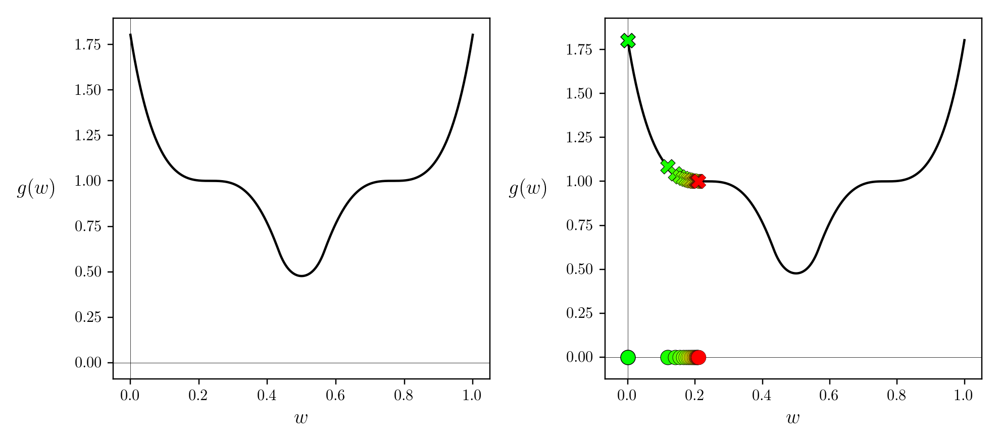

In [15]:
g = lambda w: np.maximum(0,(3*w - 2.3)**3 + 1)**2 + np.maximum(0, (-3*w + 0.7)**3 + 1)**2

# run the visualizer for our chosen input function, initial point, and step length alpha
demo = optlib.gradient_descent_demos.visualizer();

# draw function and gradient descent run
demo.draw_2d(g=g, w_inits = [0],steplength = 0.01,max_its = 20,version = 'unnormalized',wmin = 0,wmax = 1.0)

#### <span style="color:#a50e3e;">Example 4. </span>  Gradient descent scales well with input dimension

Since the gradient immediately supplies us with an excellent descent direction, the gradient descent algorithm scales gracefully with input dimension (unlike zero-order methods which - as we saw in the previous Chapter - are not crippled by this).  In this example we showcase this fact by employing gradient descent to minimize a simple quadratic function of the form

\begin{equation}
g\left(\mathbf{w}\right)=\mathbf{w}^{T}\mathbf{w}+2
\end{equation}

starting at the point 

\begin{equation}
\mathbf{w}^{0}=\left[\begin{array}{c}
1\\
0\\
0\\
\vdots\\
0
\end{array}\right]_{ N\times1}.
\end{equation}

Because the global minimum of this quadratic function is always given as $\mathbf{w}^{\star} = \mathbf{0}_{N\times 1}$ regardless of the input (via the first order condition for optimality) it is very easy to judge the progress of gradient descent applied to minimizing this function.  

This example mirrors the one given in Section 5.3.6 - where it was used to illustrate how zero-order local optimization methods fail to scale even with moderate sizes of $N$ - only here we will set $N$ considerably larger than was done there yet see that gradient descent still works quite effectively.

Below we set $N = 10,000$ and time a run of gradient descent setting $\mathbf{w}^0$ as described above and fixing $\alpha = 0.1$ for 100 steps of gradient descent.  As printed out after the run we reach a point extremely close to the true solution at the origin in less than a $10^{th}$ of a second. 

In [16]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.dot(w.T,w) + 2

# run gradient descent 
N = 10000; w = np.zeros((N,1)); w[0] = 1;
alpha = 0.1; max_its = 100;

# time a run of gradient descent
t0 = time.time()
weight_history,cost_history = gradient_descent(g,alpha,max_its,w)
t1 = time.time()

# determine best set of weights from run
ind_best = np.argmin(cost_history)
best_weights = weight_history[ind_best]

# print our resulting runtime and proximity of best step to the true solution
print ('the best weights were ' + str(np.linalg.norm(best_weights)) + ' distance away from the true solution')
print ('total optimization time: ' + str(t1-t0)+ ' seconds') 

the best weights were 1.41347765182e-08 distance away from the true solution
total optimization time: 0.03713393211364746 seconds


#### <span style="color:#a50e3e;">Example 5. </span>  Just like all local methods, one needs to carefully choose the steplength parameter $\alpha$

At each step of the random search algorithm (introduced in Section 5.4) if we lucked onto a descent direction we took a step in its direction since - by design - it always led to a point lower on the function.  If we could find no such point we stayed put.  With gradient descent things are slightly different, in particular the descent direction and whether or not we descend in the function itself when taking a step in this direction are de-coupled.

At each step of gradient descent we *always* have a descent direction - this is defined explicitly by the negative gradient itself, we need not have to search one out as with the random local search method (which becomes almost impossible to do in higher input dimensions).  This is a huge plus.  However whether or not we descend in the function when taking this step depends completely on how far along it we travel, or in other words our choice of the steplength parameter.  This is not to say that the general steplength rules we have seen so far - i.e., fixing the steplength to a hand-tuned constant for all steps or using a diminishing steplength like $\alpha = \frac{1}{k}$ - are not perfectly applicable for use with gradient descent - they absolutely are.  Indeed these are the most popular choices for setting the steplength parameter in machine learning / deep learning.  Nonetheless there are even more more mathematically sound but often more expensive choices for the selecting steplengths for gradient descent we will in the next Section.  But it is important to keep in mind the fact that just because we move in a descent *direction* with gradient descent does not mean that we always descend in the function itself when using a fixed or diminishing steplength rule.

We illustrate this general principle in the next Python cell using a slider widget to animate what the first 5 steps of (unnormalized) gradient descent look like applied to the simple quadratic function $g(w) = w^2$.  Here we initialize at $w^0 = -2.5$ using a fixed steplength parameter rule.  We show the function evaluation at each step of the algorithm (not the step itself, which is in the input space), and color them from green at the start of the run to red when the last step is taken.  As you move the slider from left to right each frame shows a different run with a slightly increased fixed steplength value  $\alpha$ used for all steps, whose numerical value is printed above the left panel.  In the beginning the steplength is extremely small - so small that we do not descend very much at all.  On the other end of the spectrum however, when we set 

In the right panel we show what a *cost function plot* that simply plots the evaluation of $g$ at each step of gradient descent run sequentially in order from the evaluation of the initial point $g\left(w^0\right)$ on the left, to the final step evaluation $g\left(w^5\right)$.  We also color these points from green (start of run) to red (end of run).  The cost function plot is a very useful tool in general - particularly for multi-input functions that take in $N > 2$ inputs (so most machine learning / deep learning problems) which we cannot directly visualize - for understanding the behavior any local search method like gradient descent. 


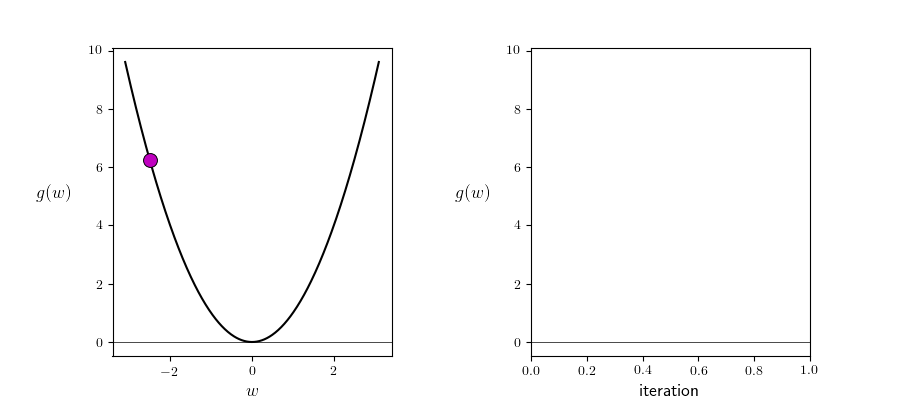
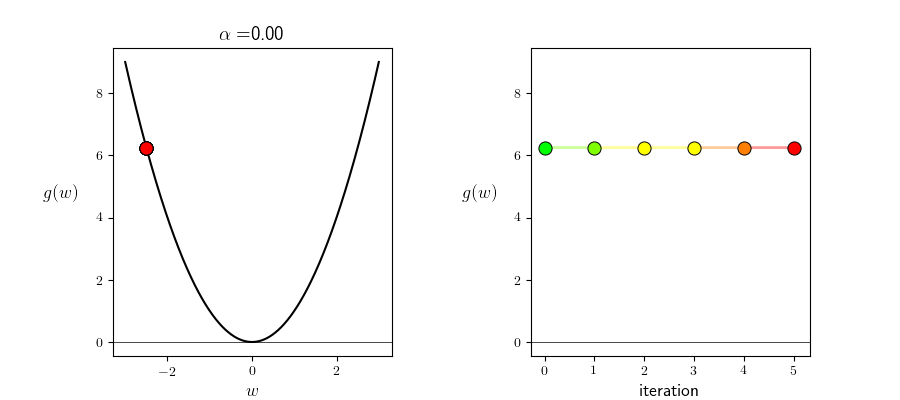
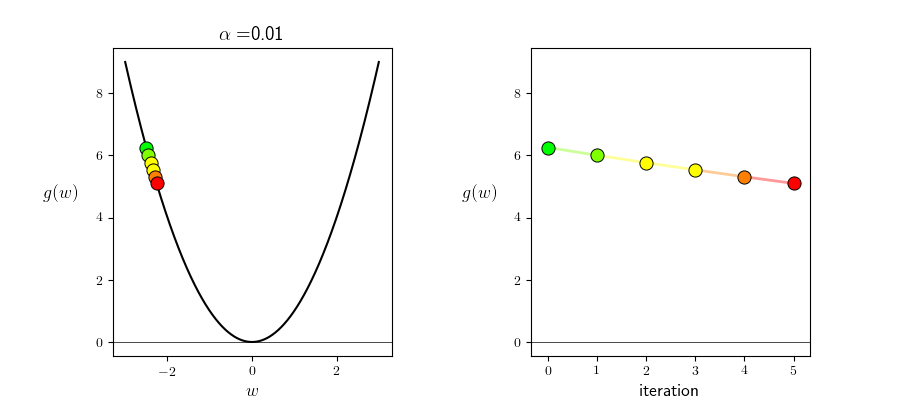
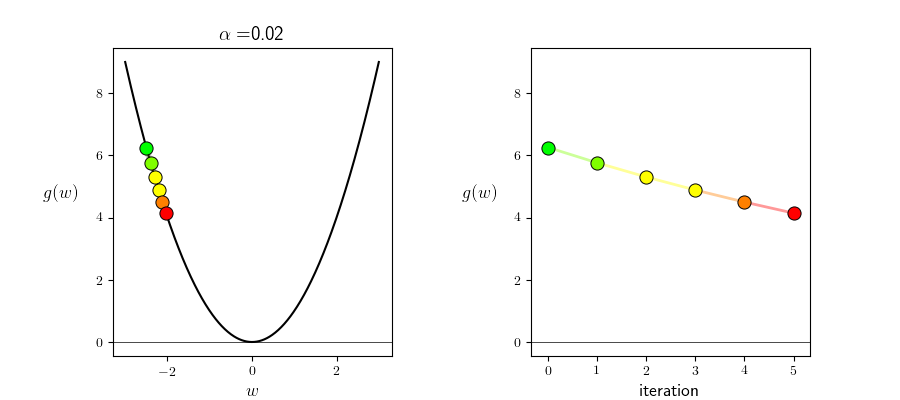
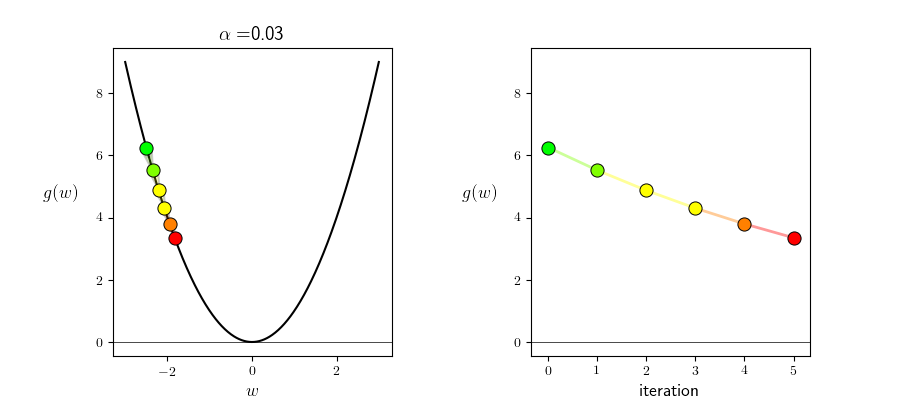
...
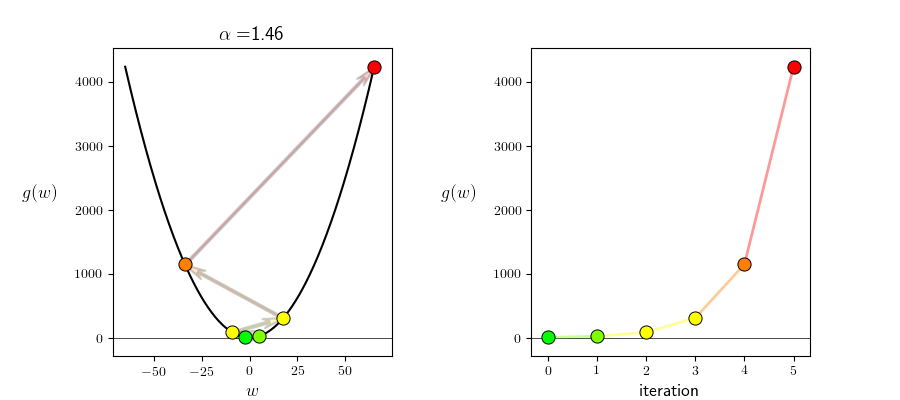
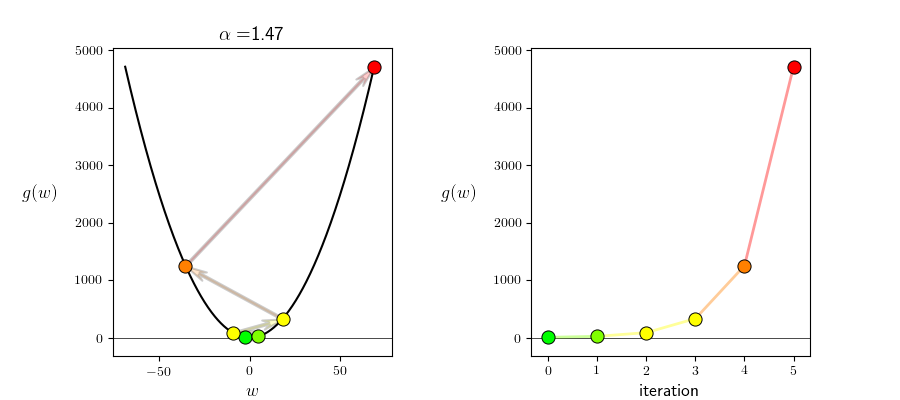
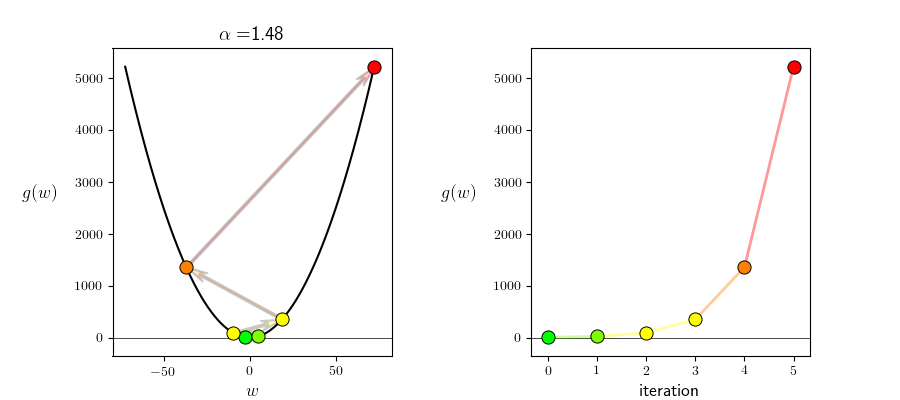
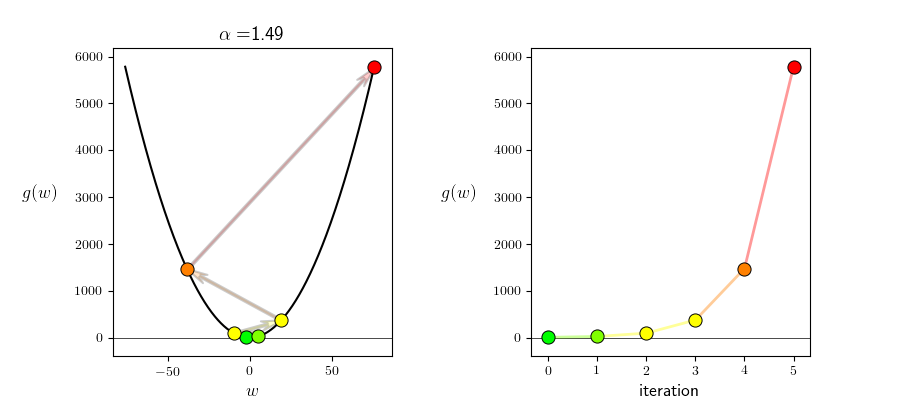
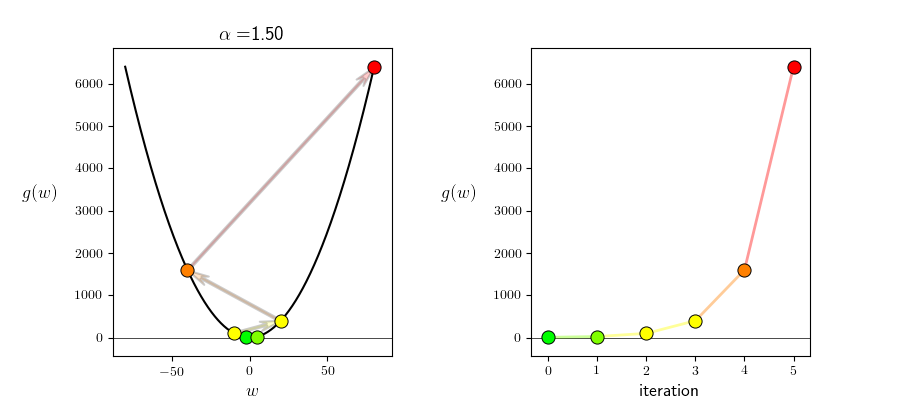

In [17]:
# what function should we play with?  Defined in the next line., nice setting here is g = cos(2*w), w_init = 0.4, alpha_range = np.linspace(2*10**-4,1,200)
g = lambda w: w**2

# create an instance of the visualizer with this function
demo = optlib.grad_descent_steplength_adjuster_2d.visualizer()

# run the visualizer for our chosen input function, initial point, and step length alpha
w_init = -2.5
steplength_range = np.linspace(10**-5,1.5,150)
max_its = 5
demo.animate_it(w_init = w_init, g = g, steplength_range = steplength_range,max_its = max_its,tracers = 'on',version = 'unnormalized')

When the steplength parameter is set too large, and the sequence of evaluations begins to rocket out of control, the sequence of steps is said to *diverge*.  This sort of example suggests that it is good practice when implementing gradient descent (employing  hand-tuned fixed steplength or diminishing steplength rule) one should usually, at each step, make sure to also keep track of the best weights seen thus far in the process (i.e., those providing the lowest function value).  This is because the final weights resulting from the run may not in fact provide the lowest value depending on function / steplength parameter setting / etc.,

We illustrate this same concept for a function taking in two inputs - here the simple sinusoid $g\left(w_1,w_2\right) = \text{sin}(w_1)$


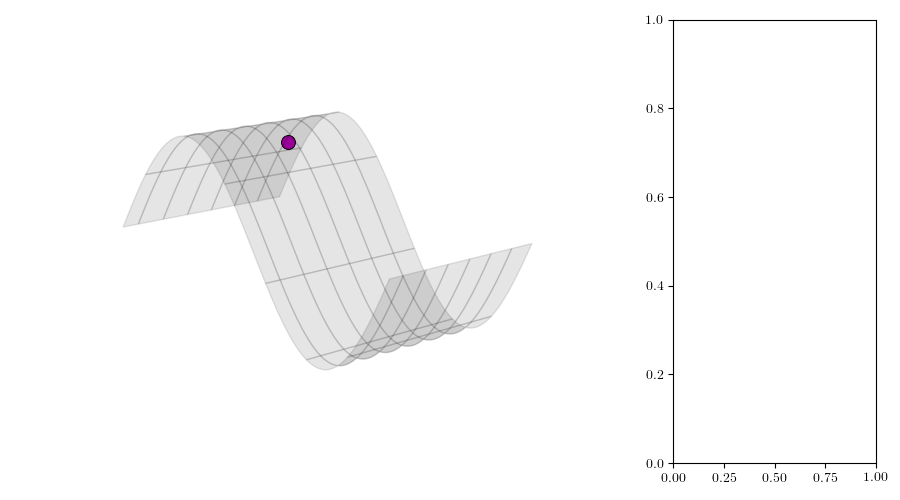
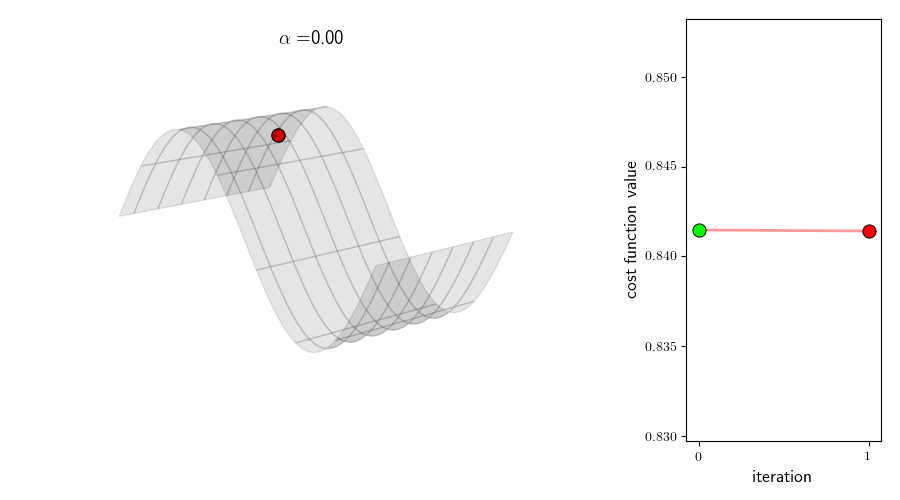
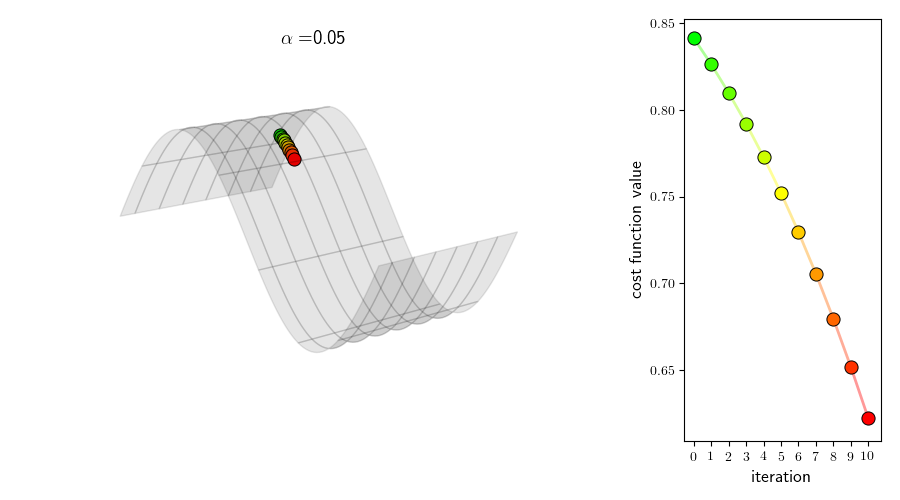
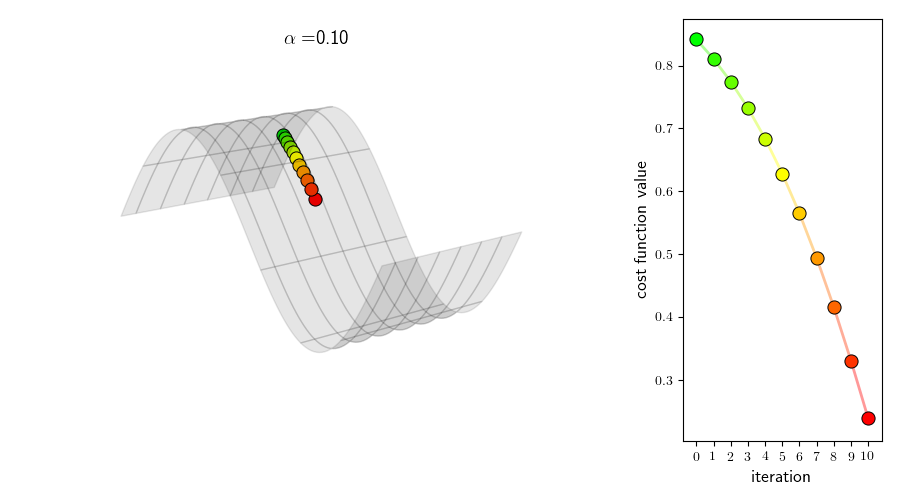
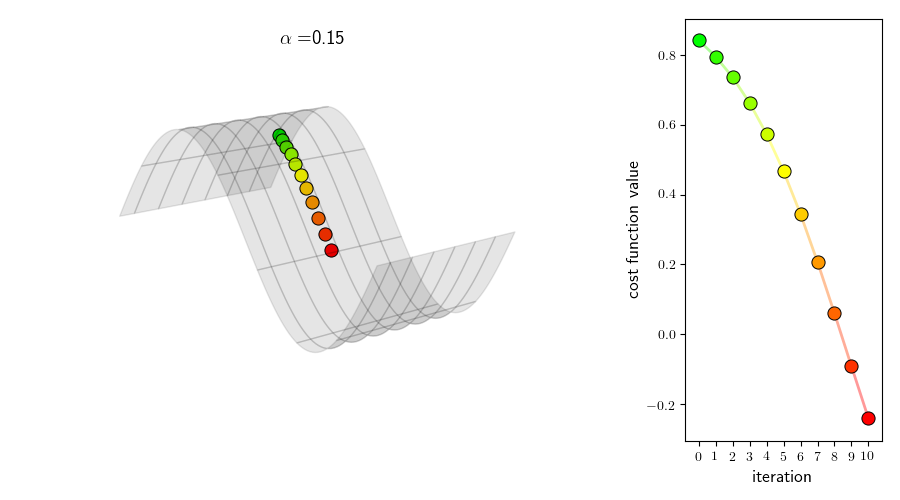
...
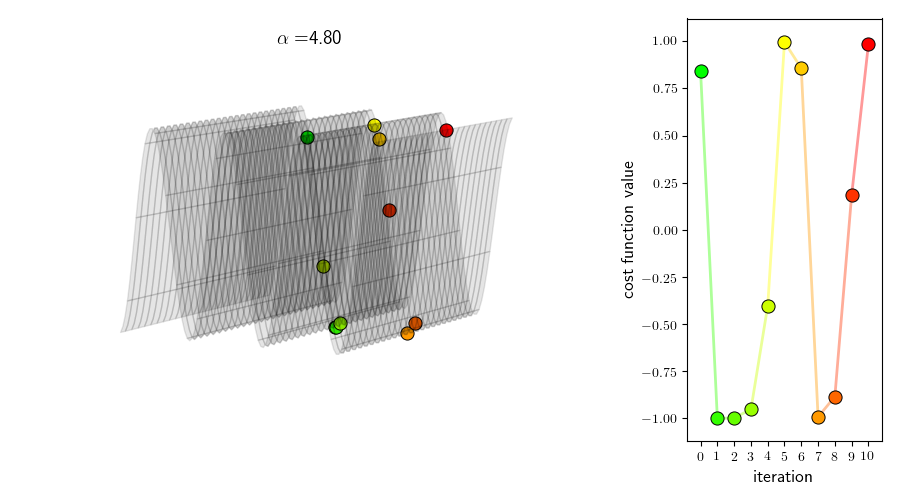
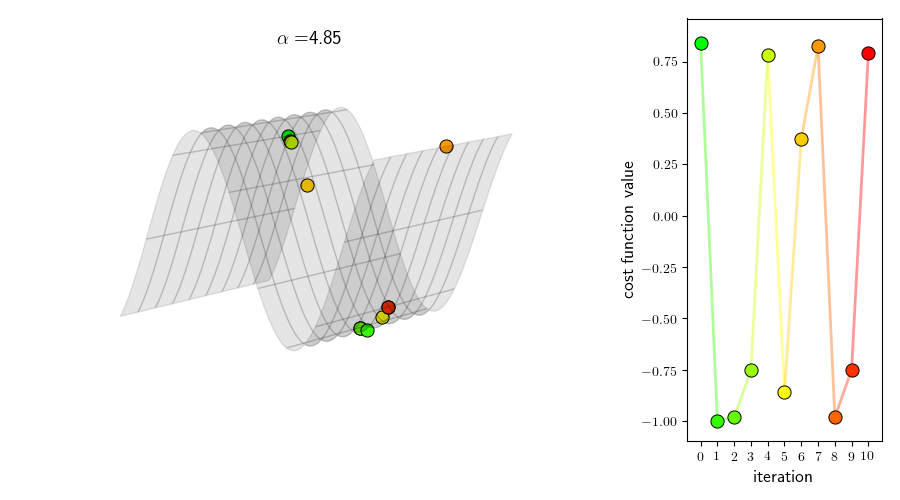
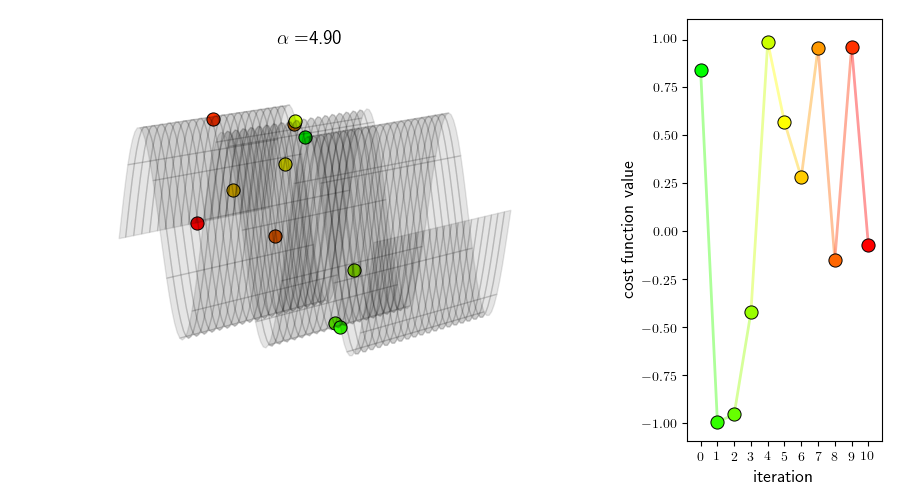
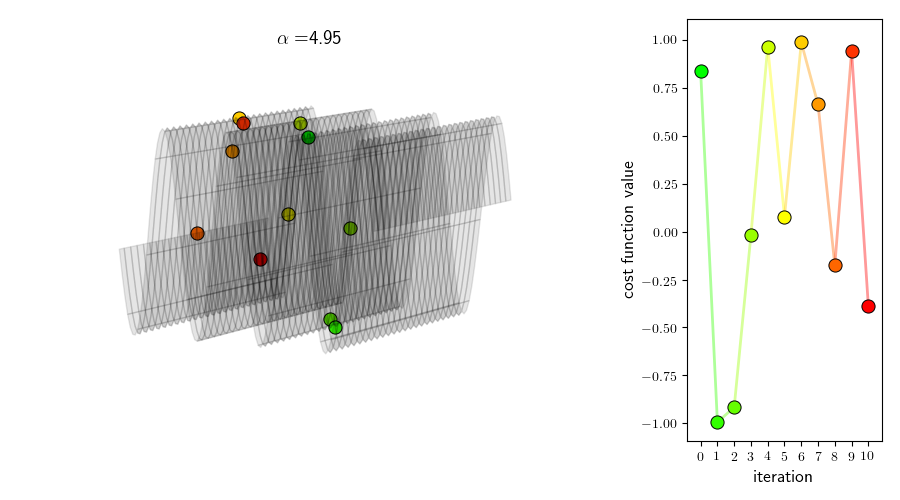
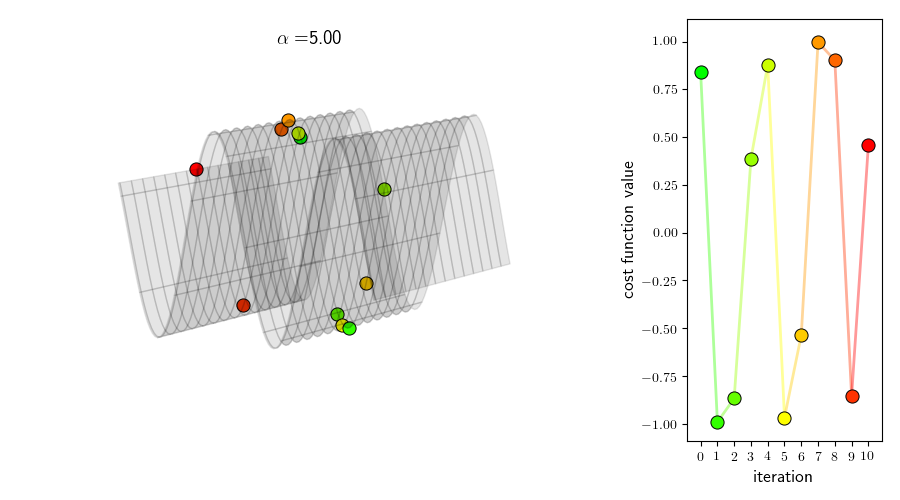

In [18]:
# what function should we play with?  Defined in the next line., nice setting here is g = cos(2*w), w_init = 0.4, alpha_range = np.linspace(2*10**-4,1,200)
g = lambda w: np.sin(w[0])

# create an instance of the visualizer with this function
demo = optlib.grad_descent_steplength_adjuster_3d.visualizer()

# run the visualizer for our chosen input function, initial point, and step length alpha
w_init = [1,0]; alpha_range = np.linspace(2*10**-4,5,100); max_its = 10; view = [10,120];
demo.animate_it(g = g,w_init = w_init,alpha_range = alpha_range,max_its = max_its,view = view)

Below we illustrate the comparison of a fixed steplength scheme and a the diminishing steplength rule to minimize the function

\begin{equation}
g(w) = \left \vert w \right \vert.
\end{equation}

Notice that this function has a single global minimum at $w = 0$ and a derivative defined (everywhere but at $w = 0$)

\begin{equation}
\frac{\mathrm{d}}{\mathrm{d}w}g(w) = \begin{cases}
+1 \,\,\,\,\,\text{if} \,\, w > 0 \\
-1 \,\,\,\,\,\text{if} \,\, w < 0.
\end{cases}
\end{equation}

which makes the use of any fixed steplength scheme problematic for gradient descent.  Below we make two runs of $20$ steps of gradient descent each initialized at the point $w^0 = 2$, the first with a fixed steplength rule of $\alpha = 0.5$ (left panel) for each and every step, and the second using the diminishing steplength rule $\alpha = \frac{1}{k}$ (right panel).

<IPython.core.display.Javascript object>


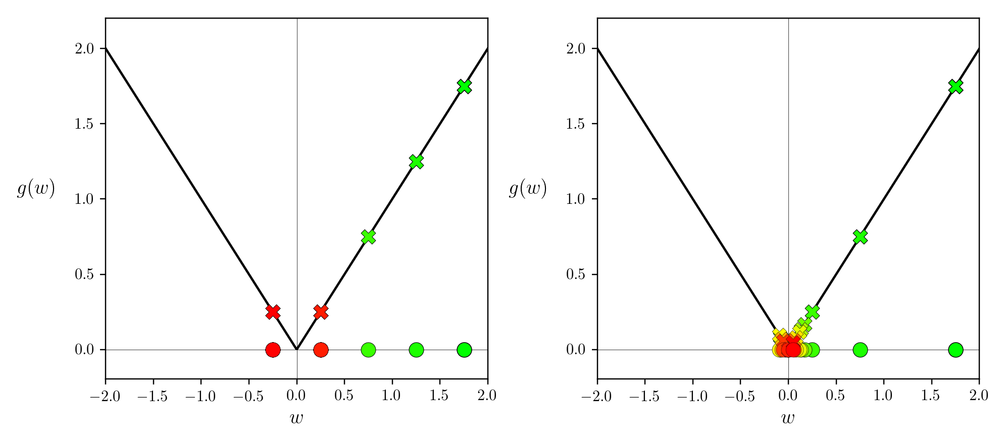

In [19]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.abs(w)

# run gradient descent
alpha_choice = 0.5; w = 1.75; max_its = 20;
weight_history_1,cost_history_1 = gradient_descent(g,alpha_choice,max_its,w)

alpha_choice = 'diminishing'; w = 1.75; max_its = 20;
weight_history_2,cost_history_2 = gradient_descent(g,alpha_choice,max_its,w)

# make static plot showcasing each step of this run
static_plotter.single_input_plot(g,[weight_history_1,weight_history_2],[cost_history_1,cost_history_2],wmin = -2,wmax = 2,onerun_perplot = True)

We can see that indeed here a diminishing steplength is absolutely necessary in order to reach a point close to the minimum of this function.  We can see this even more clearly via the cost function history plot below.

<IPython.core.display.Javascript object>


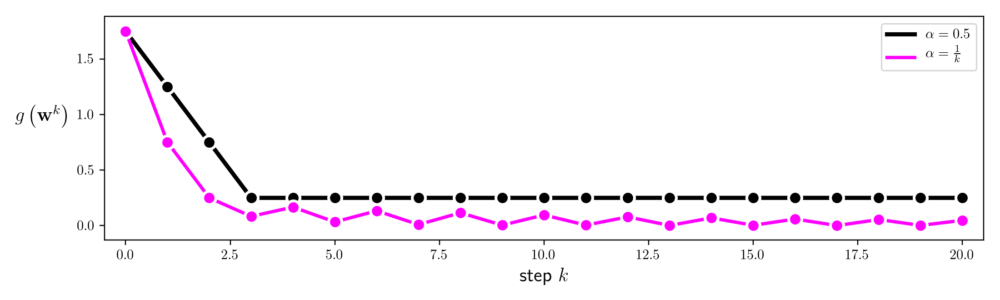

In [20]:
# plot the cost function history for a given run
static_plotter.plot_cost_histories([cost_history_1,cost_history_2],start = 0,points = True,labels = [r'$\alpha = 0.5$',r'\alpha = \frac{1}{k}$'])

## 6.4.3  Convergence behavior and steplength parameter selection

When do we know gradient descent has reached a local minimum?  In other words, how do we know when to stop the algorithm? 

There are an array of mathematically rigorous ways of halting a local search method like gradient descent, wherein steps are taken until the steps are provably close to a stationary point of the function being minimized.  First and foremost among these is the *length (or magnitude) of the gradient* $\left\Vert \nabla g\left(\mathbf{w}^{\,k-1}\right)\right\Vert_2$.  If this value is *small* then the algorithm has by definition reached a stationary point of the function, and so we halt its progress having great confidence in the high quality of our final step.  Of course this can be a mistake if in fact it is a saddle point that is being reached.

Comparatively speaking, just setting a maximum number of iterations and letting the algorithm run until that number has been reached is certainly not nearly as rigorous an approach, and may not lead us to a point as close to a local minimum.  But it is *practical and fast* (comparatively speaking), and this speaks to how - generally speaking - mathematical optimization can be used in machine learning / deep learning.  Well founded mathematically rigorous laws are sometimes ignored, and we play 'fast and loose' with the rules.  Finding points that are infinitesimally close to a minimum is not our goal in and of itself, it is the performance of the associated learning problem that we care about.  So long as the learning problem is solved we will be happy campers.

> Halting the procedure after a pre-set number of maximum iterations is a common stopping condition for gradient descent in the machine learning / deep learning community.

What is good number for a maximum iteration count?  This is typically set manually / heuristically, and is influenced by things like computing resources, knowledge of the particular function being minimized, and - very importantly - the choice of the steplength parameter $\alpha$.  Smaller choices for $\alpha$ - while more easily providing descent at each step - frequently require more for the algorithm to achieve significant progress.  Conversely if $\alpha$ is set too large gradient descent may bounce around erratically forever never localizing in an adequate solution.

While there are a variety of mathematical tools we will detail in the next post that can give guidance as to how to set $\alpha$ in general, often in practice in machine learning / deep learning problems the steplength parameter $\alpha$ is determined by *trial and error*.  This often includes running gradient descent a number of times while trying out different fixed $\alpha$ values, or various diminishing steplength schemes, to determine which provides the lowest function value.

> Often in practice in machine learning / deep learning problems the steplength parameter $\alpha$ is determined by *trial and error*.  This often includes running gradient descent a number of times and trying out several fixed $\alpha$ values for all iterations, or various diminishing steplength schemes.

## 6.4.4 The use of an Automatic Differentiator

Throughout the remainder of this text we will often need to compute the first derivative(s) of a differentiable function in order to employ the sort of optimization algorithms we detailed in this Section.  Because we will need to make such calculations for a wide variety of functions we will be employing an Automatic Differentiator - i.e., a calculator that computes derivative(s) of an input function.  We describe the construction of Automatic Differentiators extensively in Chapter 3, but here it suffices to understand the context in which we are using this tool along with a basic fact about how this tool performs computations (see Section 3.11 for a complete introduction to the basic functionality of the particular gradient calculator we will be using here).  

Even though we will often be using a calculator to compute our gradients, you should still understand the basic rules of differentiation described in Section 3.3 since we will need them to compute derivatives by hand when discussing certain fundamental paradigms and in the structural analysis of certain functions.  For example, in Section 6.1 we studied the first order condition for optimality, where it made sense to study a number of hand-computed examples.  We will also see the need for hand-computed derivatives in the next Section where we discuss mathematically derived steplength values for gradient descent.  

So, how much hand-computing mastery do you need going forward?  Not much: just make sure you can follow the sort of examples shown in Section 6.1.  In other words, you need a proficiency level on par with your ability to perform multiplication by hand.  You can compute simple multiplication examples quickly yourself because you understand the principles of arithmetic - e.g., computing $8 \times 7$ or $5 \times 2$ is a breeze - but how do you compute $140,283,197,523 \times 224,179,234,112$, and fast?  By using a calculator.  This is exactly how we treat derivative taking: for simple examples, when we need to, we do it ourselves.  Otherwise we just use a calculator - called an Automatic Differentiator.

We will be using an Automatic Differentiator in most implementations of our optimization algorithms because it is both convenient and computationally efficient.  We certainly could have computed a number of the derivative(s) used in the examples of this Section 'by hand'.  But there is little added value in spending our limited time / resources doing this if we can use a calculator to get the same results - especially since our focus here is on understanding and implementing optimization algorithms for the purposes of machine learning / deep learning.  Moreover, the gradient evaluations we perform via an Automatic Differentiator are very efficient compared with how we might implement for a particular function 'by hand' for most cases.

Finally remember one important fact about how the Automatic Differentiator works (as detailed in Chapter 3).  When we evaluate the gradient $\nabla g\left(\mathbf{w}^{\star}\right)$ of a function $g\left(\mathbf{w}\right)$ at some point $\mathbf{w}^{\star}$ using an Automatic Differentiator, the corresponding function evaluation $g\left(\mathbf{w}^{\star}\right)$ is always computed along the way.  One can think of the cost function evaluation as a bi-product of our gradient computation, we always get it 'for free' when we evaluate a gradient.

This is important because together over a single run these function evaluations constitute our *cost function plot*, the primary de-bugging tool we have to ensure e.g., we have tuned the steplength parameter correctly.  The cost function plot is one of our primary de-bugging tools we will use throughout the text with all of our optimization algorithms, and there is no need to re-compute the function evaluations after a run since we can collect them along the way whenever we employ an Automatic Differentiator. 